# scRNAseq Data Analysis - from QC to Manual Annotation

 * PART 0. Reproducibility
*PART 1. Basic quality control and filtering.
*PART 2. Normalization and dimensionality reduction
*PART 3. Normalization and careful clustering of the cleaned dataset
*PART 4. Differential expression and marker selection
*Saving

# Setup

This notebook should introduce you to some typical tasks, using Scanpy eco-system.(https://scanpy.readthedocs.io/en/stable/tutorials.html).


Let's import the necessary packages and read in the Cellranger-formatted data folder output.

In [1]:
import scanpy as sc
import numpy as np
import re
import os
import pandas as pd
import seaborn as sb
import matplotlib
import scipy.sparse as sp
from scipy.sparse import issparse
import anndata2ri

import matplotlib as mpl
from scipy import stats as scistats
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
import bbknn
from pathlib import Path
from ipywidgets import interactive

sc._settings.ScanpyConfig.n_jobs=8

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1
sc.set_figure_params(color_map='viridis')
colorsComb = np.vstack([pl.cm.Reds(np.linspace(0, 1, 10)), pl.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

import muon as mu
from muon import prot as pt

%matplotlib inline
import panel as pn
#pn.extension(sizing_mode="stretch_width", comms='colab')
pn.extension( comms='colab')


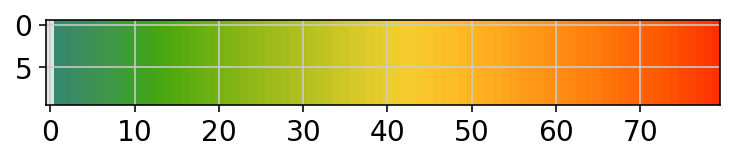

In [2]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

In [3]:
# add extra code to the path
import sys
sys.path.append('/content/sctoolkit/sctoolkit/')
from proportions import *

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.


# PART 0. Reproducibility

In [4]:
%load_ext watermark
%watermark
%watermark --iversions -v -m -p numpy,scipy,sklearn,anndata,scanpy,muon,anndata2ri,rpy2

Last updated: 2022-07-15T16:05:32.187193+00:00

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 8.3.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.13.0-1031-aws
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 8.3.0

numpy     : 1.21.6
scipy     : 1.8.0
sklearn   : 0.0
anndata   : 0.7.8
scanpy    : 1.9.1
muon      : 0.1.2
anndata2ri: 1.1
rpy2      : 3.5.1

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.13.0-1031-aws
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

sys       : 3.9.12 | packaged by conda-forge | (main, Mar 24 2022, 23:25:59) 
[GCC 10.3.0]
scanpy    : 1.9.1
colorcet  : 3.0.0
seaborn   : 0.11.2
matplotlib: 3.5.2
numpy     : 1.21.6
panel     : 0.13.1
bbknn     : 1.5.1
scipy     : 1.8.0
logging   : 0.5.1.2
re        : 2.2.1
anndata2ri: 1.1
pandas    : 1.2.5
muon    

# PART 1. Basic quality control and filtering.

# Setup data directory

In [5]:
data_dir = '/home/jovyan/work/shared-data/Multiome_Results/Brain/'
os.getcwd()
os.chdir('/home/jovyan/work/')
os.getcwd()
data_dir='/home/jovyan/work/public-data/scRNA/Cell_line1_M_outs'

In [6]:
os.getcwd()

'/home/jovyan/work'

In [7]:
#Change XXX to sample name
#folder='/content/'

yourname='Meethila'

samplename='Cells'
random_state=42

import os

if not os.path.exists('./figures/'):
    os.makedirs('./figures/')

# Setup WD

shared-data/Multiome_Results/Brain/filtered_feature_bc_matrix/matrix.mtx.gz# import data as H5AD


Reading the matrix with cache enabled helps save time on I/O operations, which is particularly relevant for bigger datasets.

In [8]:
adata = sc.read_10x_mtx("public-data/scRNA/Mix7_outs/filtered_feature_bc_matrix",cache = True)
adata

AnnData object with n_obs × n_vars = 4225 × 36601
    var: 'gene_ids', 'feature_types'

Let's make sure all gene names are unique. This is done with var_names_make_unique function.

In [9]:
adata.var_names_make_unique()
adata
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC133551.1', 'AC136612.1', 'AC136616.1', 'AC136616.3', 'AC136616.2',
       'AC141272.1', 'AC023491.2', 'AC007325.1', 'AC007325.4', 'AC007325.2'],
      dtype='object', length=36601)

We can also explore the newly created AnnData object. The obs field will contain all of per-cell metadata; for now, it only has the barcodes.

In [10]:
adata.obs.head()

""
AAACAGCCAAACTGTT-1
AAACAGCCAAGGACCA-1
AAACATGCAAGGATTA-1
AAACATGCAGTAGGTG-1
AAACCAACAAGATTCT-1


Lets add some metadata

In [11]:
adata.obs['sample']=[samplename]*adata.n_obs
adata.obs['group']=['mix7']*adata.n_obs

In [12]:
adata.obs.head()

,sample,group
AAACAGCCAAACTGTT-1,Cells,mix7
AAACAGCCAAGGACCA-1,Cells,mix7
AAACATGCAAGGATTA-1,Cells,mix7
AAACATGCAGTAGGTG-1,Cells,mix7
AAACCAACAAGATTCT-1,Cells,mix7


Let's remove all genes expressed in fewer than 5 cells:

In [13]:
sc.pp.filter_genes(adata, min_cells=5)
adata

AnnData object with n_obs × n_vars = 4225 × 21570
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types', 'n_cells'

# Filter doublets with scrublet

For filter doublets with scrublet, we would need the expected doublet formation rate. These values can be found [here](https://uofuhealth.utah.edu/huntsman/shared-resources/gba/htg/single-cell/genomics-10x.php). Since our dataset has approximately 5,000 (recovered) cells, we take the 2.3%.

Calling the main function, `scrub_doublets`, calculates a score for each cell, and assigns the binary (doublet/singlet) prediction based on this score. We can store this data as metadata in the `adata` object.

In [14]:
sce.pp.scrublet(adata,expected_doublet_rate = 0.010,threshold=None)

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


Automatically set threshold at doublet score = 0.17
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 5.3%
Overall doublet rate:
	Expected   = 1.0%
	Estimated  = 6.7%


The following histogram is an important diagnostic plot. Doublet score threshold should separate the two shoulders of the bimodal distribution. If this is not so, adjust the threshold accordingly.

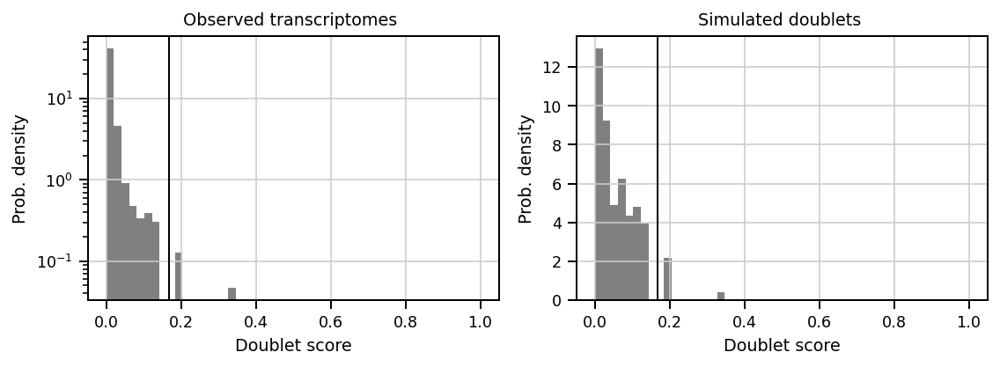

In [15]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(adata,save=savefig)

In [16]:
adata.obs

,sample,group,doublet_score,predicted_doublet
AAACAGCCAAACTGTT-1,Cells,mix7,0.014533,False
AAACAGCCAAGGACCA-1,Cells,mix7,0.011318,False
AAACATGCAAGGATTA-1,Cells,mix7,0.025231,False
AAACATGCAGTAGGTG-1,Cells,mix7,0.013793,False
AAACCAACAAGATTCT-1,Cells,mix7,0.002118,False
...,...,...,...,...
TTTGTGTTCCGGAACC-1,Cells,mix7,0.003471,False
TTTGTTGGTTGCACAA-1,Cells,mix7,0.011874,False
TTTGTTGGTTTAGCTC-1,Cells,mix7,0.004825,False
TTTGTTGGTTTGAGCA-1,Cells,mix7,0.015334,False


Let's calculate some information about mitochondrial genes, which is important for quality control (high MT gene content usually means dead cells). We also will calculate the fraction of ribosomal proteins which can be used as another useful identifier of cell state. 

In [17]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

# compute qc metrics

adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['rb'] = adata.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

adata

AnnData object with n_obs × n_vars = 4225 × 21570
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

# Helper plots for determining gene and count threshold values

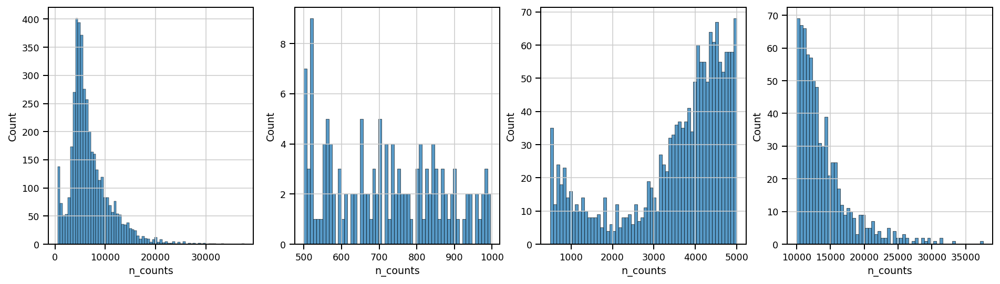

In [18]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_counts'], kde=False, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<5000], kde=False, bins=60, ax=ax3,)
ax4_dict = sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60, ax=ax4, )
savefig='figures/'+samplename + '_1_QC_counts_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

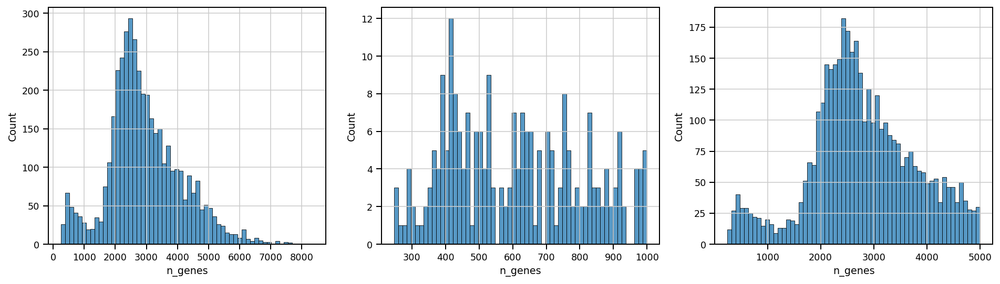

In [19]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<5000], kde=False, bins=60, ax=ax3,)
savefig='figures/'+samplename + '_2_QC_gene_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

Plot correlations and make sure that high mitochondrial content corresponds with low total counts (dead cells), and that total counts have strong positive correlation with the number of expressed genes:

... storing 'sample' as categorical
... storing 'group' as categorical
... storing 'feature_types' as categorical


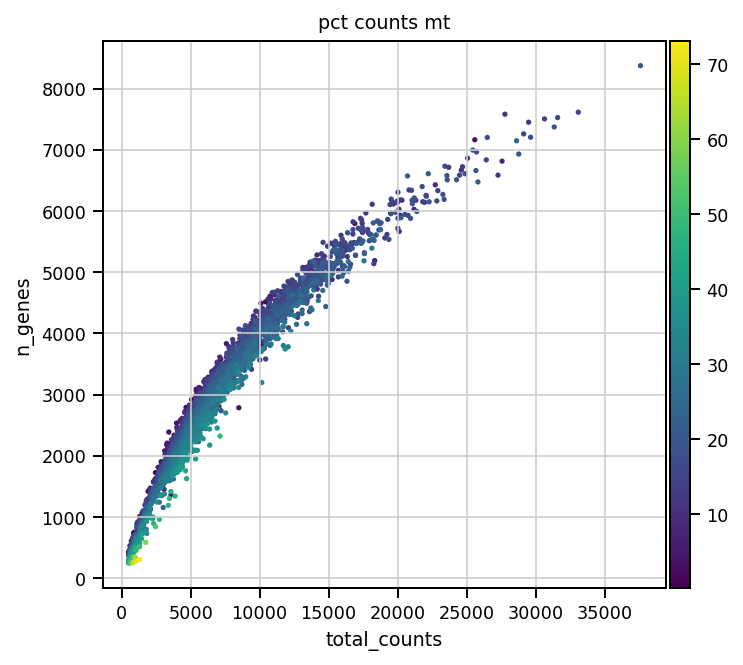

In [20]:
# plot percentage of mitochondtial genes versus count depth and n_genes
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
savefig=samplename + '_4_QC_saturationplot.pdf'
sc.pl.scatter(adata, x='total_counts', y='n_genes', color='pct_counts_mt',save=savefig)

Filter outliers cells with >150,000 couts

In [21]:
sc.pp.filter_cells(adata, max_counts = 35000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

Number of cells after max count filter: 4224


High ribosomal protein content can correlate inversly with  with MT, and may contain biological information.( Do not apply to snRNASeq. Why?)

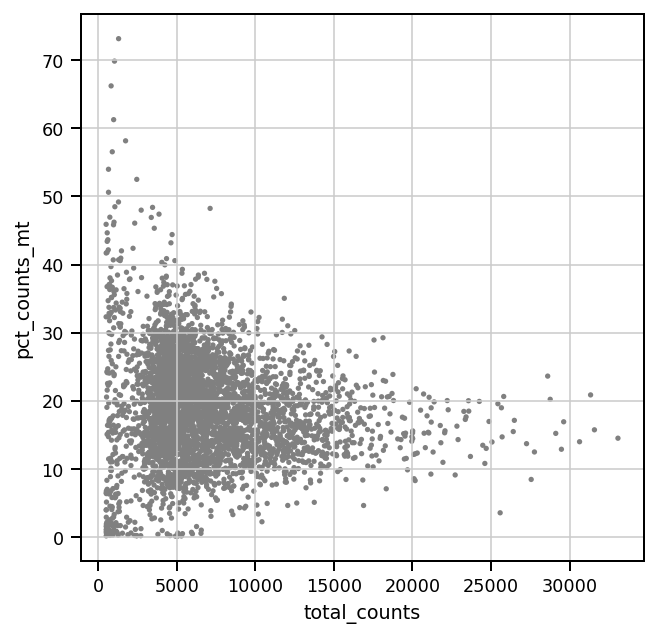

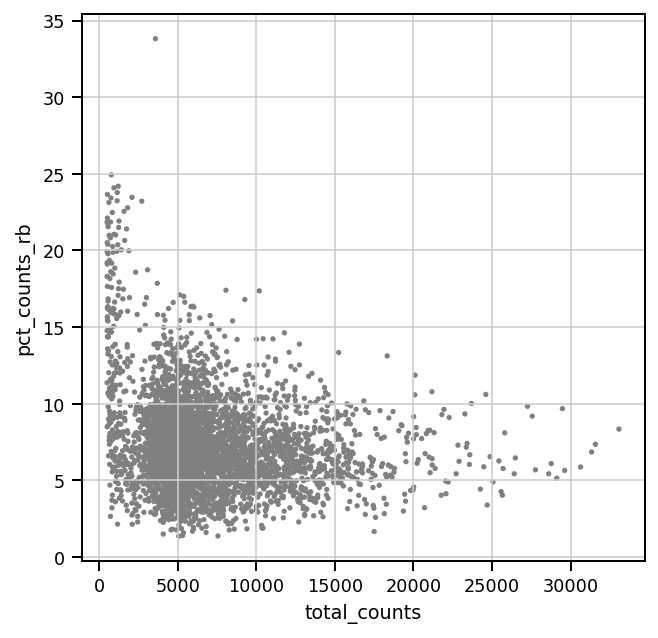

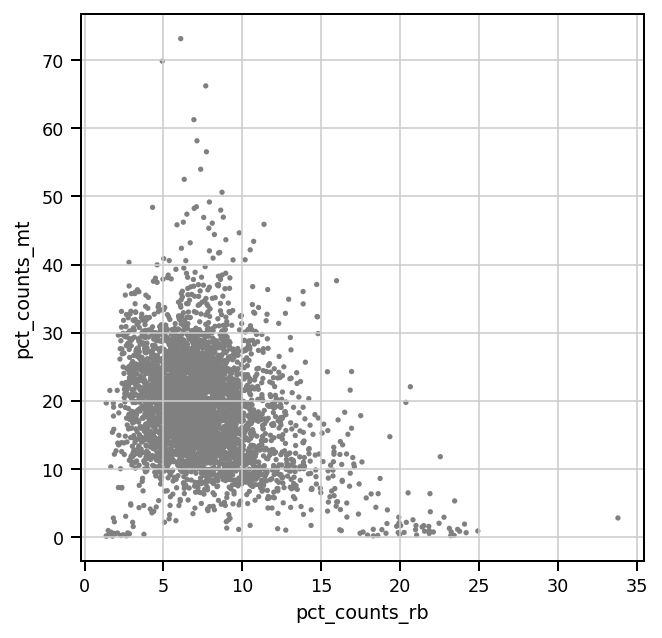

In [22]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rb')
sc.pl.scatter(adata, x='pct_counts_rb', y='pct_counts_mt')

A violin plot of the computed quality measures can help us analyze the dataset in general and make decisions about cutoffs.

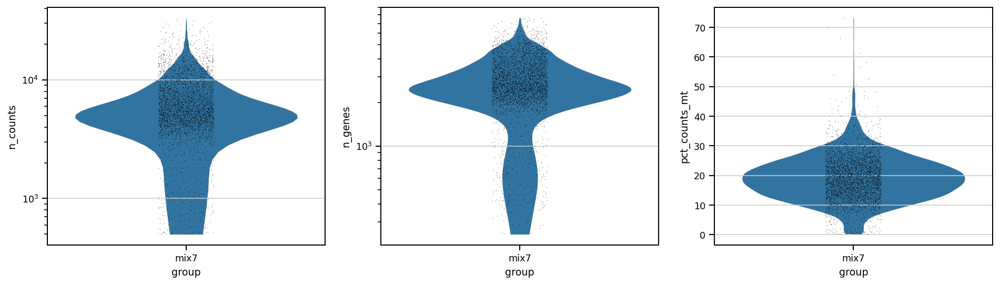

In [23]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='group', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='group', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='group',size=0.5, ax=ax3, show=False,)
savefig='figures/'+samplename + '_5_QC_violin_plots.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

Let's show those genes that yield the highest fraction of counts in each single cell, across all cells.

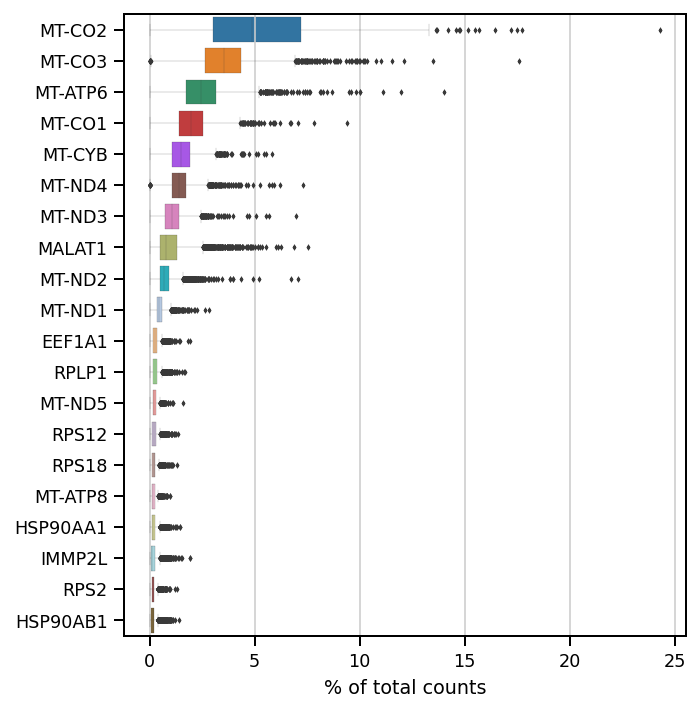

In [24]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
savefig='_'+samplename + '_6_QC_highest_expr_genes.pdf'
sc.pl.highest_expr_genes(adata, n_top=20,save=savefig,)

In [25]:
print(adata.obs['group'].value_counts())

mix7    4224
Name: group, dtype: int64


In [26]:
adata.obs['n_counts'].sum()/adata.obs['group'].value_counts()

mix7    6861.685606
Name: group, dtype: float64

In [27]:
adata.obs['n_counts'].sum()

28983760.0

# Interactive filtering

In [28]:
def h(counts=400, genes=400,mito=25):
    conditions = [(adata.obs['predicted_doublet'] == True),(adata.obs['n_genes_by_counts'] < counts),(adata.obs['n_genes'] < genes),(adata.obs['pct_counts_mt'] >mito),(adata.obs['pct_counts_mt'] <= mito) & (adata.obs['n_genes_by_counts'] >= counts) & (adata.obs['n_genes'] >= genes)& (adata.obs['predicted_doublet'] != True)]
    values = ['Doublet', 'Low_nFeature', 'Low_ngenes','High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')

    new_df1=pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p=sb.barplot(x='index',y='QC',data=new_df1,color='sandybrown')
    show_values(p)


interactive_plot = interactive(h, counts=(0, 2000,20), genes=(0, 2000,20), mito=(0, 100, 1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=400, description='counts', max=2000, step=20), IntSlider(value=400, desc…

In [29]:
adata.obs['QC'].value_counts()

Passing         3369
High_MT          803
Low_nFeature      37
Doublet           15
Name: QC, dtype: int64

## Plot QC for cells that pass tentative thresholds

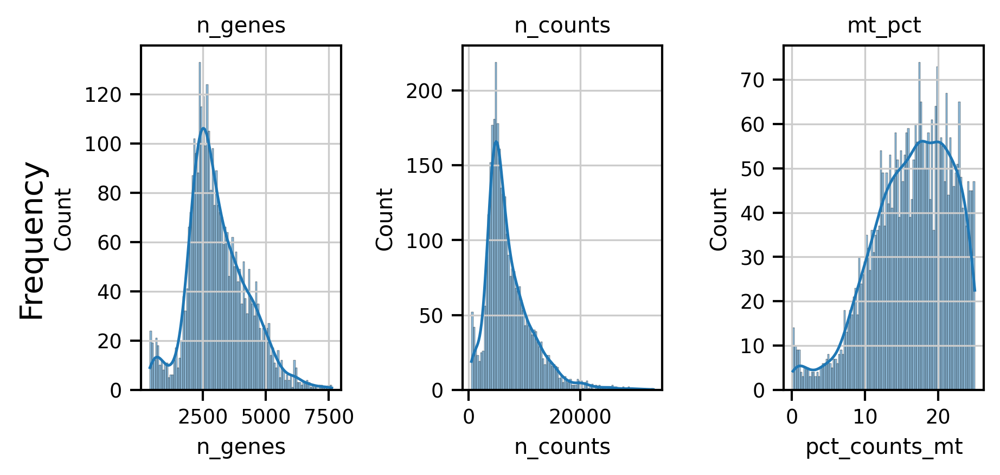

In [30]:

sb.set_context('paper')


fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(6, 3), dpi=150, sharey=False)
adata.obs['n_genes']

sb.histplot( adata[adata.obs['QC'] == 'Passing'].obs['n_genes'], ax=ax1, kde=True, bins=100)
sb.histplot( adata[adata.obs['QC'] == 'Passing'].obs['n_counts'], ax=ax2, kde=True, bins=100)
sb.histplot(adata[adata.obs['QC'] == 'Passing'].obs['pct_counts_mt'], ax=ax3, kde=True, bins=100)

ax1.title.set_text('n_genes')
ax2.title.set_text('n_counts')
ax3.title.set_text('mt_pct')

fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()
savefig='figures/'+samplename + '_3_QC_filtering_postfilter.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

# PART 2. Normalization and dimensionality reduction.

Squre root of total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells. The data are also log-transformed with a pseudocount of 1. Transformed data is stored in 'sqrt_norm' layer

In [31]:
adata.layers["raw"] = adata.X 
adata.raw=adata
adata.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata, inplace=False)["X"])

pearson residuals normalization used for Dimention reduction, stored in normalized

The comand will :
 * Calculate pearson residuals for each gene 
 * Identify highly-variable genes to prioritize in further analysis.
 * Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [32]:
sc.experimental.pp.recipe_pearson_residuals(adata,n_top_genes=3000,n_comps=100,random_state=42,inplace=True)
adata.layers["normalized"]=adata.X

adata

AnnData object with n_obs × n_vars = 4224 × 21570
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable'
    uns: 'scrublet', 'group_colors', 'hvg', 'pca', 'pearson_residuals_normalization'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw', 'sqrt_norm', 'normalized'

Plot the highly variable genes, after the normalization.

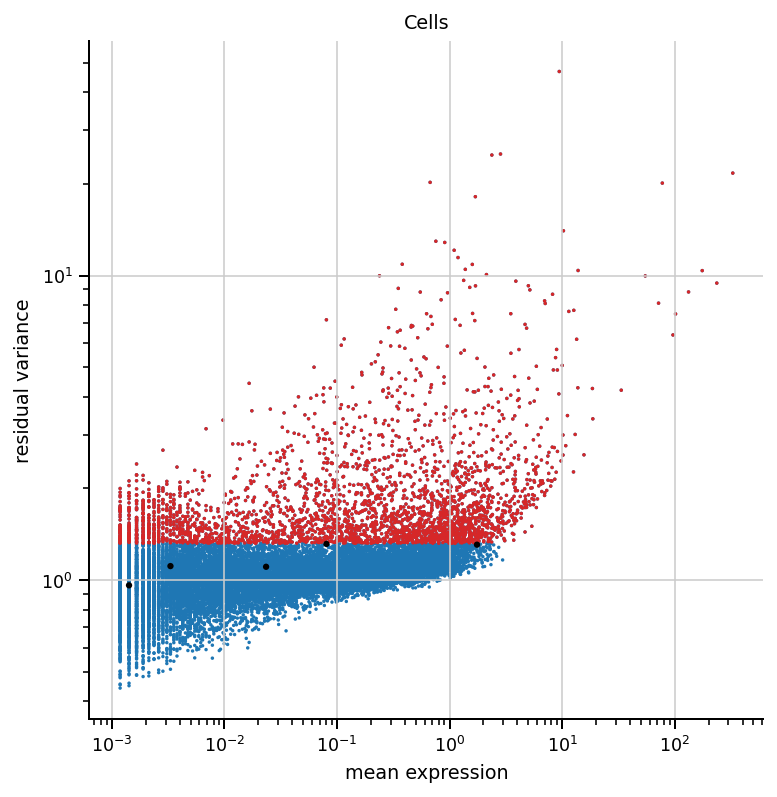

In [33]:
markers = ["IL7R","LYZ","CD14","MS4A1","CD8A","GNLY","NKG7","FCGR3A","MS4A7","FCER1A","CST3","PPBP",]
hvgs = adata.var["highly_variable"]
fig, ax = plt.subplots(figsize=(6, 6))
pl.scatter(
        adata.var["mean_counts"], adata.var["residual_variances"], s=3, edgecolor="none"
    )
pl.scatter(
        adata.var["mean_counts"][hvgs],
        adata.var["residual_variances"][hvgs],
        c="tab:red",
        label="selected genes",
        s=3,
        edgecolor="none",
    )
pl.scatter(
        adata.var["mean_counts"][np.isin(adata.var_names, markers)],
        adata.var["residual_variances"][np.isin(adata.var_names, markers)],
        c="k",
        label="known marker genes",
        s=10,
        edgecolor="none",
    )
ax.set_xscale("log")
ax.set_xlabel("mean expression")
ax.set_yscale("log")
ax.set_ylabel("residual variance")
ax.set_title(samplename)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")

In [34]:
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']


In [35]:
# Split into 2 lists
#s_genes = cell_cycles_genes[:43]
#g2m_genes = cell_cycles_genes[43:]

# cellcycle score

 Let's calculate cell cycle scores, as described [here](https://nbviewer.jupyter.org/github/theislab/scanpy_usage/blob/master/180209_cell_cycle/cell_cycle.ipynb). 

It is important to note that cell cycle analysis has to be done after normalization 

In [36]:


#s_genes = ['Mcm5','Pcna','Tyms','Fen1','Mcm7','Mcm4','Rrm1','Ung','Gins2','Mcm6','Cdca7','Dtl','Prim1',
#           'Uhrf1','Cenpu','Hells','Rfc2','Polr1b','Nasp','Rad51ap1','Gmnn','Wdr76','Slbp','Ccne2','Ubr7',
 #          'Pold3','Msh2','Atad2','Rad51','Rrm2','Cdc45','Cdc6','Exo1','Tipin','Dscc1','Blm','Casp8ap2',
  #         'Usp1','Clspn','Pola1','Chaf1b','Mrpl36','E2f8']
#g2m_genes = ['Hmgb2','Cdk1','Nusap1','Ube2c','Birc5','Tpx2','Top2a','Ndc80','Cks2','Nuf2','Cks1b',
 #            'Mki67','Tmpo','Cenpf','Tacc3','Pimreg','Smc4','Ccnb2','Ckap2l','Ckap2','Aurkb','Bub1',
  #           'Kif11','Anp32e','Tubb4b','Gtse1','Kif20b','Hjurp','Cdca3','Jpt1','Cdc20','Ttk','Cdc25c',
   #          'Kif2c','Rangap1','Ncapd2','Dlgap5','Cdca2','Cdca8','Ect2','Kif23','Hmmr','Aurka','Psrc1',
    #         'Anln','Lbr','Ckap5','Cenpe','Ctcf','Nek2','G2e3','Gas2l3','Cbx5','Cenpa']

cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))

43

54

97

In [37]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [38]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

... storing 'phase' as categorical


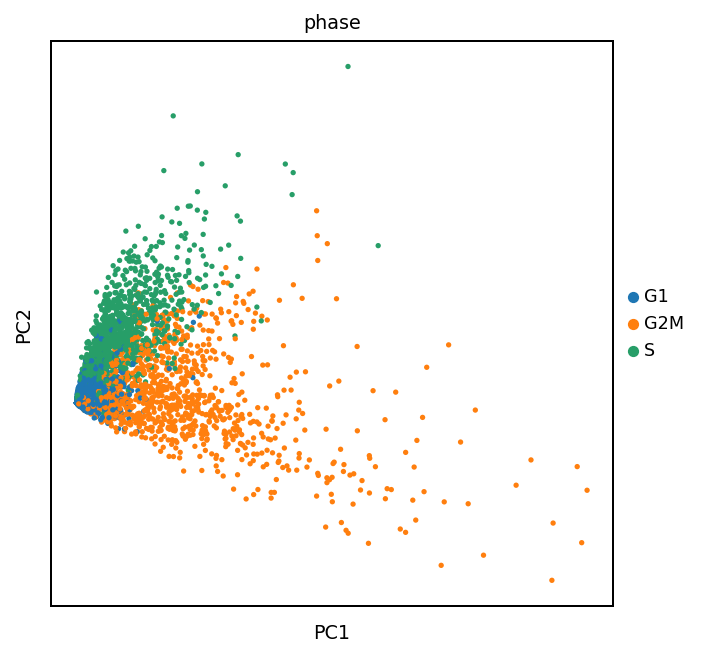

In [39]:
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')

# PCA (Ploting only)

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

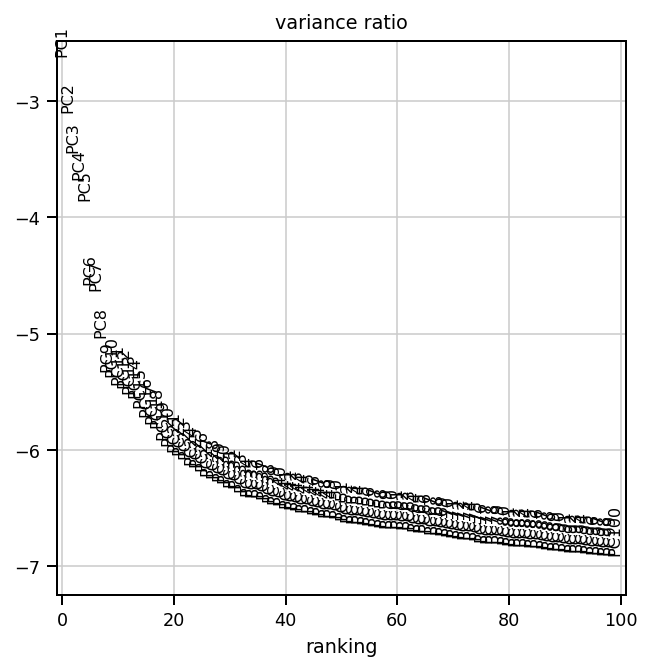

... storing 'phase' as categorical


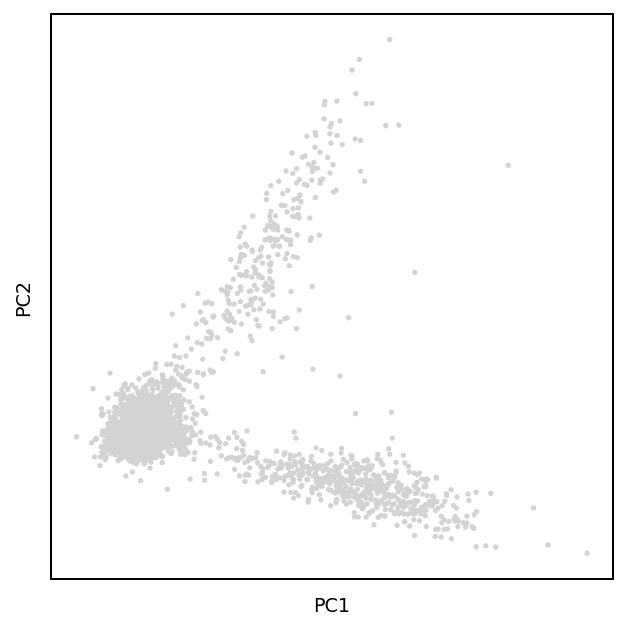

In [40]:
#sc.pp.pca(adata, n_comps = 100, use_highly_variable =False, svd_solver = "arpack")
sc.pl.pca_variance_ratio(adata, n_pcs = 100,log=True)

sc.pl.pca(adata)

UMAP and tSNE are popular methods used for dimensionality reduction and visualisation of very large datasets. UMAP is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories.

Plot the data with UMAP, with coloring according to clustering. Some larger clusters are clearly identifiable as cell populations. Other smaller clusters can be attributed to doublets, cell cycle artefacts, etc.

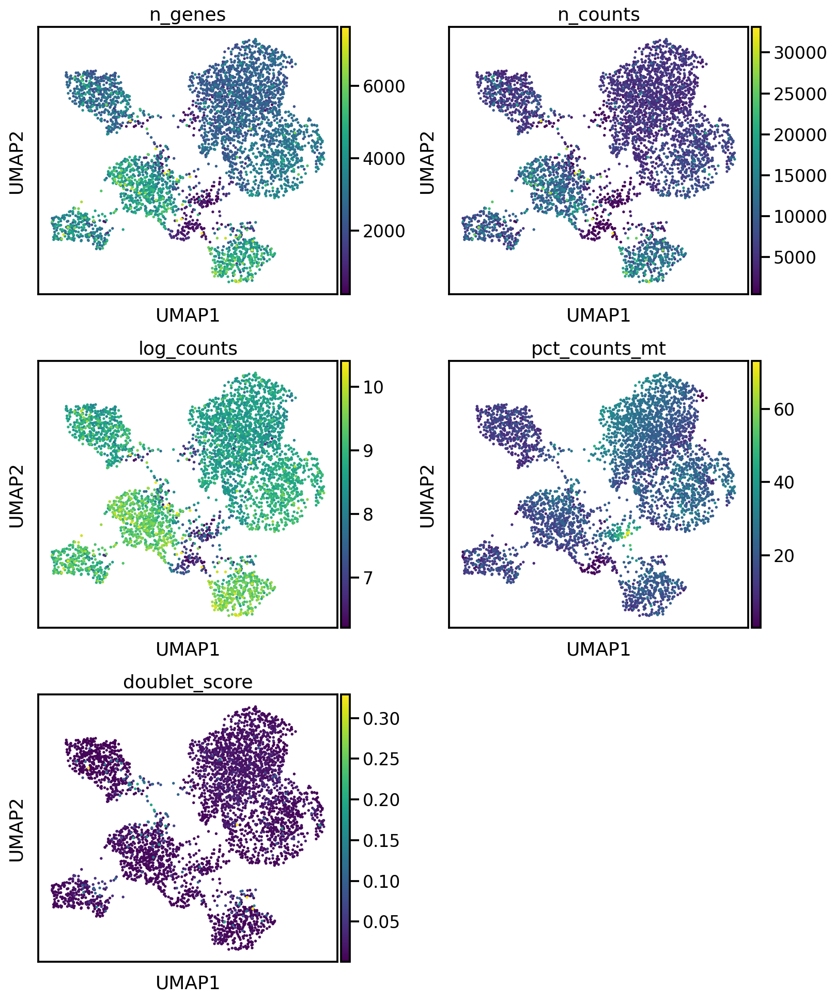

In [41]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pp.neighbors(adata, n_pcs=50,n_neighbors=10,random_state=42)

genes_to_plot = ['n_genes','n_counts','log_counts','pct_counts_mt','doublet_score']
sc.tl.umap(adata) 
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,wspace=0.25, save=savefig)

Let's remove the cells that did not pass QC and compare plots. We can now see much more defined clusters. 

In [42]:
adata = adata[adata.obs['QC'] == 'Passing']
adata.obs

,sample,group,doublet_score,predicted_doublet,n_counts,log_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb,QC,S_score,G2M_score,phase
AAACAGCCAAACTGTT-1,Cells,mix7,0.014533,False,6011.0,8.701346,2963,2963,6011.0,1134.0,18.865414,315.0,5.240393,Passing,0.212562,-0.016493,S
AAACAGCCAAGGACCA-1,Cells,mix7,0.011318,False,5218.0,8.559870,2455,2455,5218.0,1276.0,24.453814,424.0,8.125719,Passing,-0.000978,-0.157697,G1
AAACATGCAAGGATTA-1,Cells,mix7,0.025231,False,4547.0,8.422223,2300,2300,4547.0,937.0,20.606993,309.0,6.795690,Passing,-0.105575,-0.095197,G1
AAACATGCAGTAGGTG-1,Cells,mix7,0.013793,False,4484.0,8.408271,2386,2386,4484.0,790.0,17.618198,389.0,8.675290,Passing,-0.180015,-0.284288,G1
AAACCAACAAGATTCT-1,Cells,mix7,0.002118,False,1140.0,7.038784,755,755,1140.0,9.0,0.789474,265.0,23.245615,Passing,-0.023473,0.225911,G2M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGGCAATGCGCT-1,Cells,mix7,0.003471,False,4179.0,8.337828,2347,2347,4179.0,455.0,10.887772,342.0,8.183776,Passing,0.175505,0.457465,G2M
TTTGTGGCACAATTAC-1,Cells,mix7,0.006972,False,23366.0,10.059037,6191,6191,23366.0,4038.0,17.281521,1674.0,7.164256,Passing,-0.205933,5.091508,G2M
TTTGTGTTCCCGCAAA-1,Cells,mix7,0.002223,False,4727.0,8.461046,2461,2461,4727.0,567.0,11.994923,370.0,7.827374,Passing,0.161487,0.520761,G2M
TTTGTTGGTTGCACAA-1,Cells,mix7,0.011874,False,8922.0,9.096275,3675,3675,8922.0,2170.0,24.321899,648.0,7.262945,Passing,0.721419,0.568070,S


Our filtered dataset now contains 2036 cells, only 13 cells were removed!

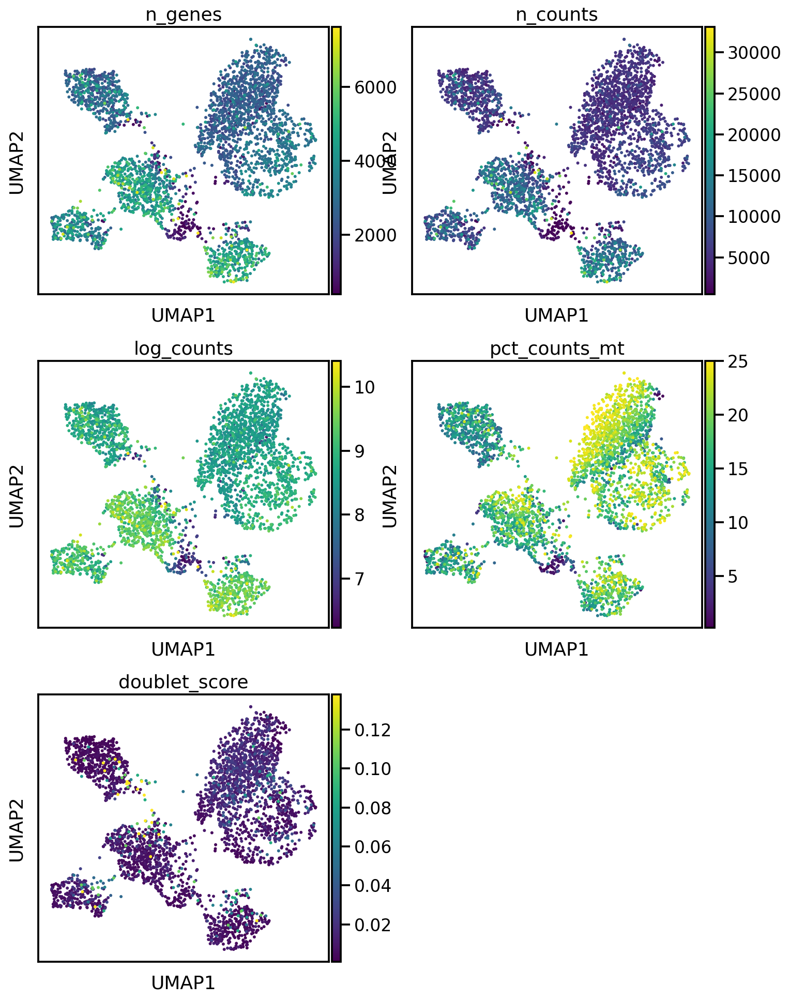

In [43]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,layer='counts',save=savefig)

# PART 3. Normalization and careful clustering of the cleaned dataset.

Let's restart our analysis from the counts matrix again

In [44]:
adata.X=adata.layers['raw']

Let's redo HVG, PCA, UMAP, and clustering analysis, since now we have QC-filtered cells.

In [45]:
#HVG
sc.experimental.pp.highly_variable_genes(adata, flavor="pearson_residuals", n_top_genes=2000)

/opt/conda/lib/python3.9/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:67: UserWarning: Received a view of an AnnData. Making a copy.


In [46]:
# Nomalization
sc.experimental.pp.normalize_pearson_residuals(adata,inplace=True)
adata.layers["normalized"]=adata.X

In [47]:
#PCA
sc.pp.pca(adata, n_comps=60,random_state=42)

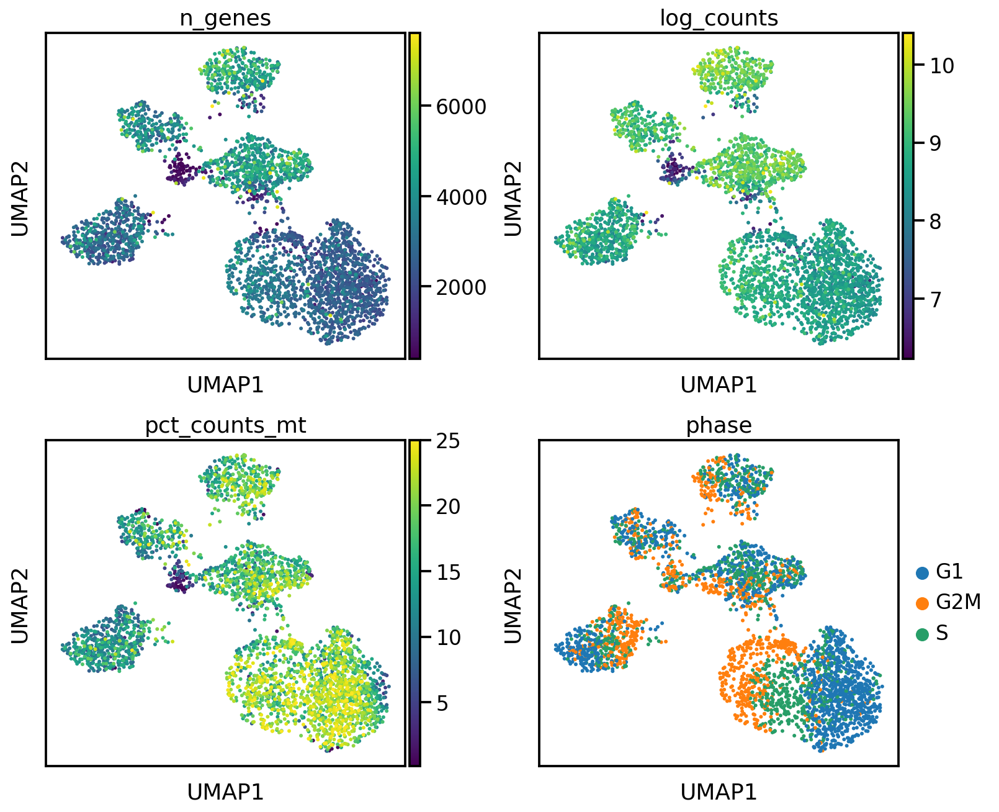

In [48]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pp.neighbors(adata, n_pcs=60,n_neighbors=15,random_state=42)

genes_to_plot = ['n_genes','log_counts','pct_counts_mt','phase']

sc.tl.umap(adata,random_state=42)
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata,wspace=0.25, color = genes_to_plot,ncols=2,save=savefig)

In [49]:
pwd

'/home/jovyan/work'

In [50]:
%%capture
sc.tl.leiden(adata,random_state=random_state,resolution=1.5, key_added='leiden_r1.5')
sc.tl.leiden(adata,random_state=random_state,resolution=1, key_added='leiden_r1')
sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')
sc.tl.leiden(adata,random_state=random_state, resolution=0.1, key_added='leiden_r0.1')

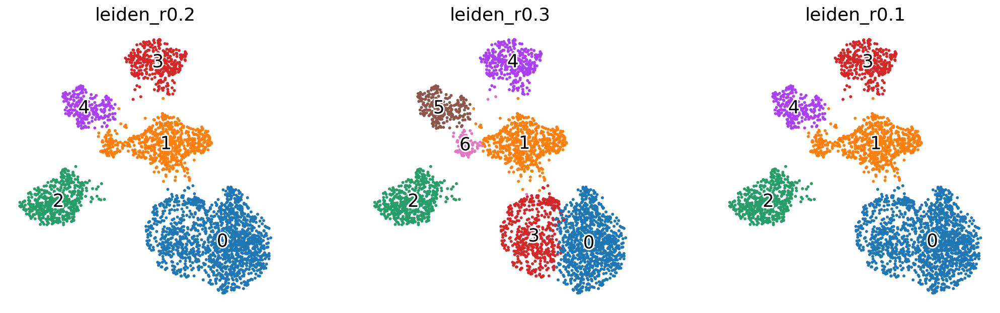

In [51]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_lores_vst.pdf"
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.3','leiden_r0.1'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

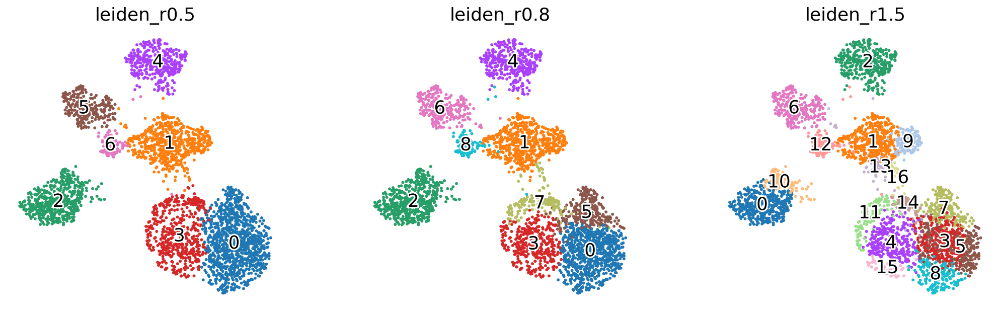

In [52]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_hires_vst.pdf"
sc.pl.umap(adata, color=['leiden_r0.5','leiden_r0.8','leiden_r1.5'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

If UMAP looks slightly less than perfect, we can use the following trick from the `scanpy` tutorial page:

In [53]:
sc.tl.paga(adata,groups='leiden_r0.2')
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

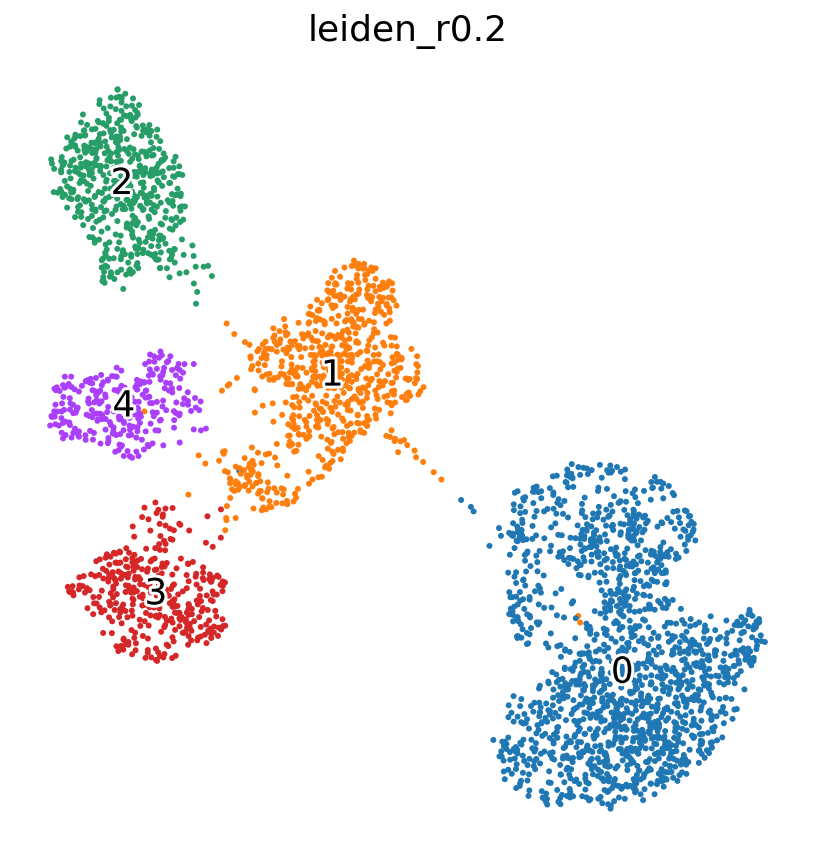

In [54]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
savefig=samplename+"_5_clustering_vst_lowres.pdf"
sc.pl.umap(adata, color=['leiden_r0.2',],ncols=3, legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

# PART 4. Differential expression and marker selection.

After we have fixed the clusters, let's make gene markers using Wilcoxon test. Score plotting for each cluster allows to estimate the relative information of a marker in a quick fashion.

# Marker genes

In [62]:
sc.pp.log1p(adata)
adata.obs

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p


,sample,group,doublet_score,predicted_doublet,n_counts,log_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,...,leiden_r1.5,leiden_r1,leiden_r0.8,leiden_r0.5,leiden_r0.4,leiden_r0.3,leiden_r0.2,leiden_r0.1,leiden,scorect
AAACAGCCAAACTGTT-1,Cells,mix7,0.014533,False,6011.0,8.701346,2963,2963,6011.0,1134.0,...,15,3,3,3,3,3,0,0,3,Cellline2
AAACAGCCAAGGACCA-1,Cells,mix7,0.011318,False,5218.0,8.559870,2455,2455,5218.0,1276.0,...,5,1,0,0,0,0,0,0,0,Cellline2
AAACATGCAAGGATTA-1,Cells,mix7,0.025231,False,4547.0,8.422223,2300,2300,4547.0,937.0,...,3,1,0,0,0,0,0,0,0,Cellline2
AAACATGCAGTAGGTG-1,Cells,mix7,0.013793,False,4484.0,8.408271,2386,2386,4484.0,790.0,...,5,1,0,0,0,0,0,0,0,Cellline2
AAACCAACAAGATTCT-1,Cells,mix7,0.002118,False,1140.0,7.038784,755,755,1140.0,9.0,...,12,9,8,6,6,6,1,1,6,Cellline5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGGCAATGCGCT-1,Cells,mix7,0.003471,False,4179.0,8.337828,2347,2347,4179.0,455.0,...,0,2,2,2,2,2,2,2,2,Cellline3
TTTGTGGCACAATTAC-1,Cells,mix7,0.006972,False,23366.0,10.059037,6191,6191,23366.0,4038.0,...,2,4,4,4,4,4,3,3,4,Cellline1
TTTGTGTTCCCGCAAA-1,Cells,mix7,0.002223,False,4727.0,8.461046,2461,2461,4727.0,567.0,...,0,2,2,2,2,2,2,2,2,Cellline3
TTTGTTGGTTGCACAA-1,Cells,mix7,0.011874,False,8922.0,9.096275,3675,3675,8922.0,2170.0,...,4,3,3,3,3,3,0,0,3,Cellline2


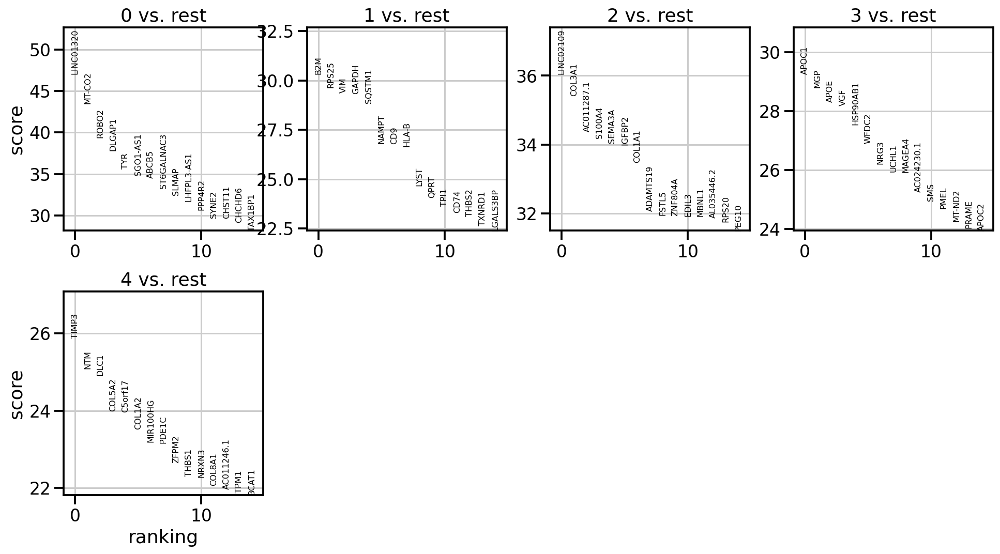

In [63]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(4,4)
sc.tl.rank_genes_groups(adata, 'leiden_r0.2', method='wilcoxon',layer='sqrt_norm',use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

lets get a table with the marker genes 

In [93]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, 'leiden_r0.2', method='wilcoxon',n_genes=adata.shape[1],layer='sqrt_norm',use_raw=False)
markers=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)
markers

,0,1,2,3,4
0,LINC01320,B2M,LINC02109,APOC1,TIMP3
1,MT-CO2,RPS25,COL3A1,MGP,NTM
2,ROBO2,VIM,AC011287.1,APOE,DLC1
3,DLGAP1,GAPDH,S100A4,VGF,COL5A2
4,TYR,SQSTM1,SEMA3A,HSP90AB1,C5orf17
5,SGO1-AS1,NAMPT,IGFBP2,WFDC2,COL1A2
6,ABCB5,CD9,COL1A1,NRG3,MIR100HG
7,ST6GALNAC3,HLA-B,ADAMTS19,UCHL1,PDE1C
8,SLMAP,LYST,FSTL5,MAGEA4,ZFPM2
9,LHFPL3-AS1,QPRT,ZNF804A,AC024230.1,THBS1


Lets visualize some markers genes

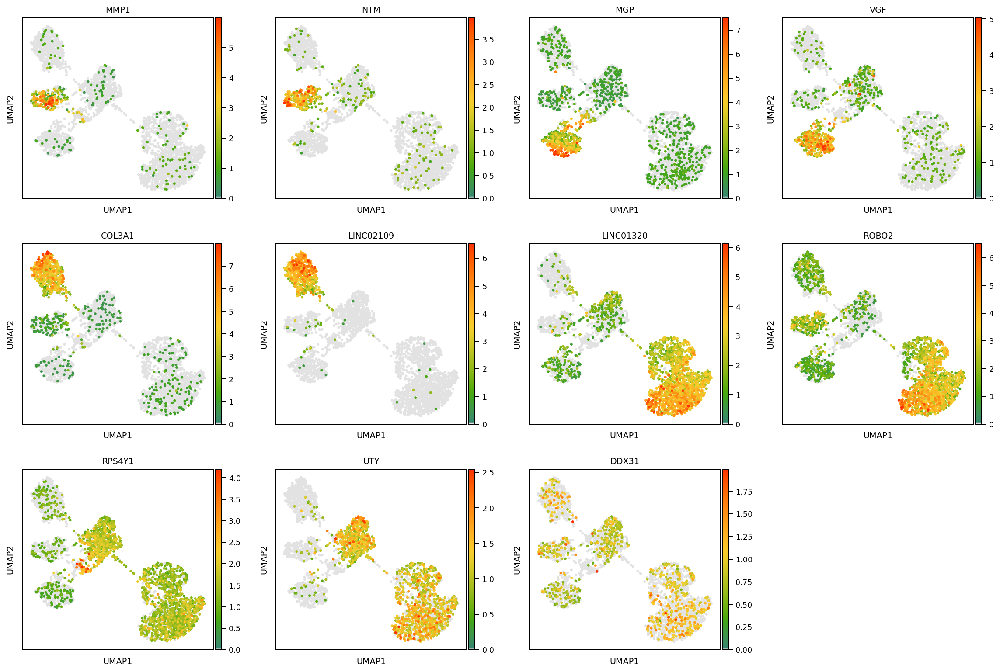

In [94]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
savefig=samplename+"_10_markers_1.pdf"
#sc.pl.umap(adata=adata, color=['TIMP3',	'SERPINE2',	'PMEL',	'CHCHD6',	'COL3A1',	'PEG10',	'RPS4Y1',	'SQSTM1'],color_map=mymap,vmin='p20', vmax='p99.9',ncols=4,
#           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="sqrt_norm", save=savefig)
sc.pl.umap(adata=adata, color=['MMP1',	'NTM',	'MGP',	'VGF',	'COL3A1',	'LINC02109',	'LINC01320',	'ROBO2','RPS4Y1','UTY', 'DDX31'],color_map=mymap,vmin='p20', vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="sqrt_norm", save=savefig)

In [95]:
# plotting-extra
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

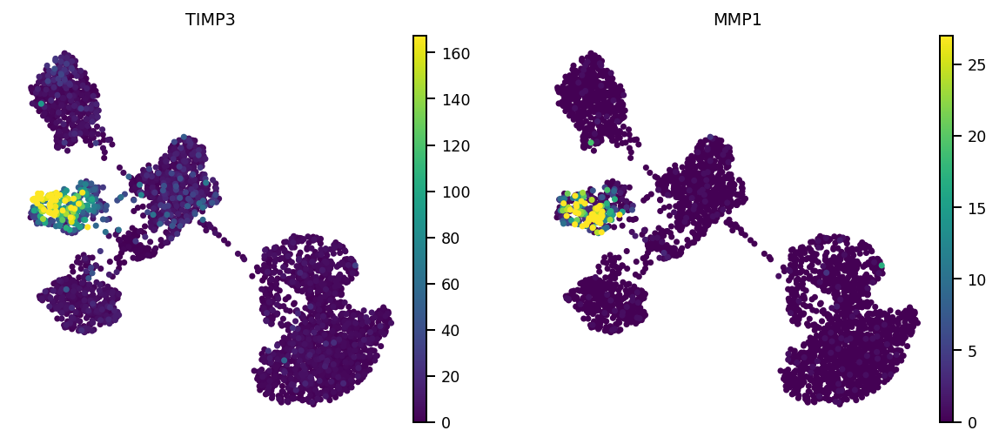

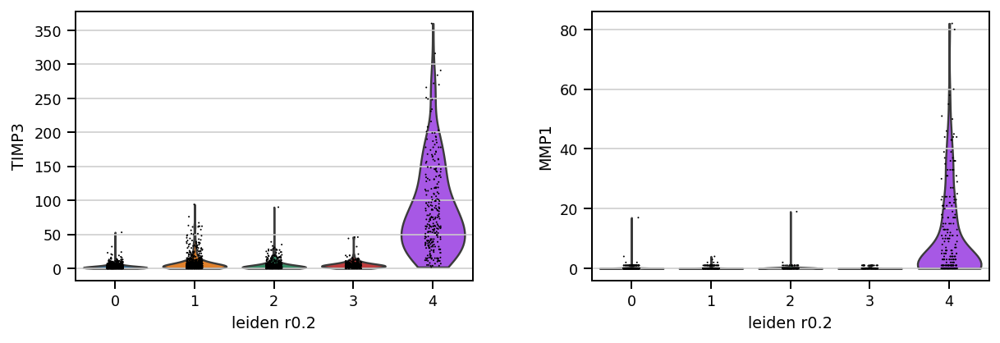

In [126]:
#for cell line 1
# rc_context is used for the figure size, in this case 4x4
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=['TIMP3',"MMP1"], s=50, frameon=False, ncols=4, vmax='p99')
    

with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(adata, ['TIMP3',"MMP1"], groupby='leiden_r0.2' )

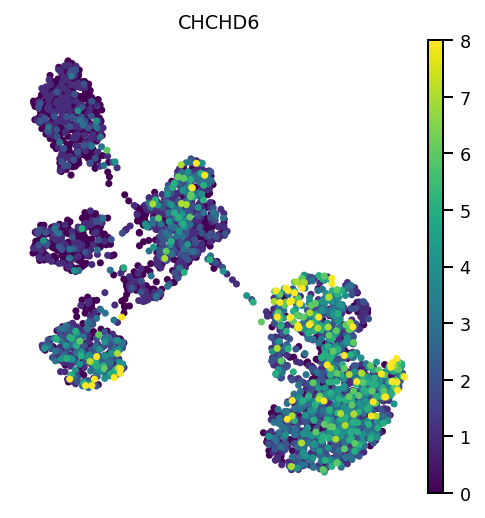

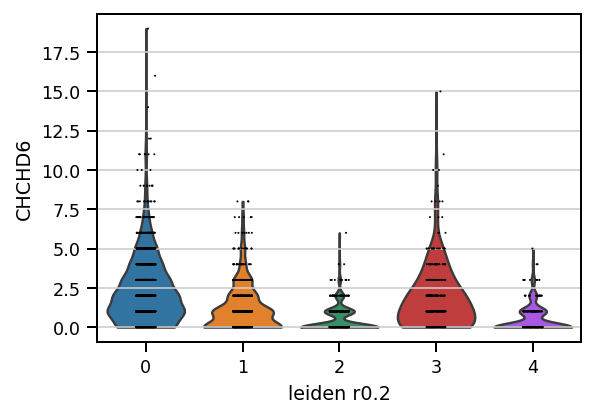

In [125]:
#for cell line 2 
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=["CHCHD6"], s=50, frameon=False, ncols=4, vmax='p99')
    
with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(adata, ["CHCHD6"], groupby='leiden_r0.2' )

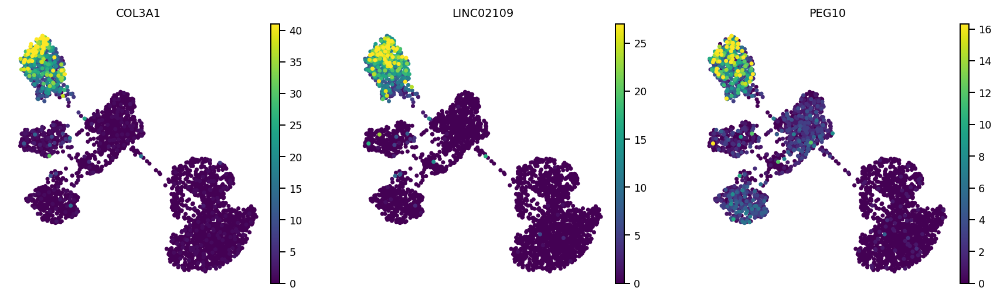

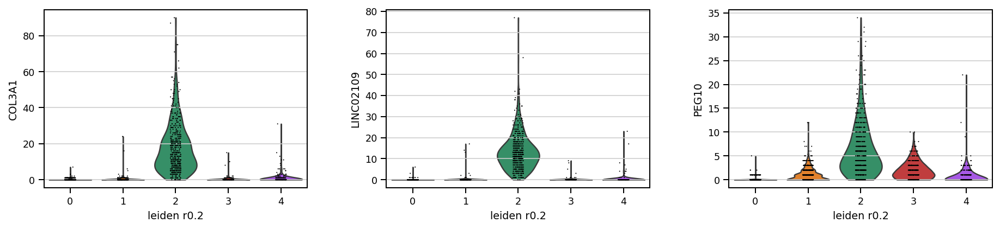

In [124]:
#for cell line 3 
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=['COL3A1',"LINC02109","PEG10"], s=50, frameon=False, ncols=4, vmax='p99')
    
    
with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(adata, ['COL3A1',"LINC02109","PEG10"], groupby='leiden_r0.2' )

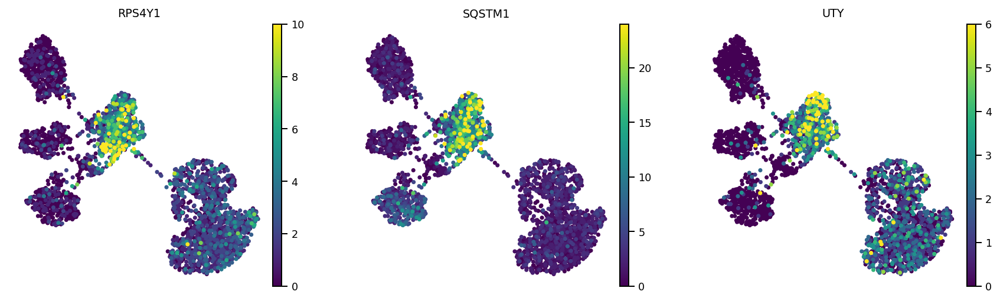

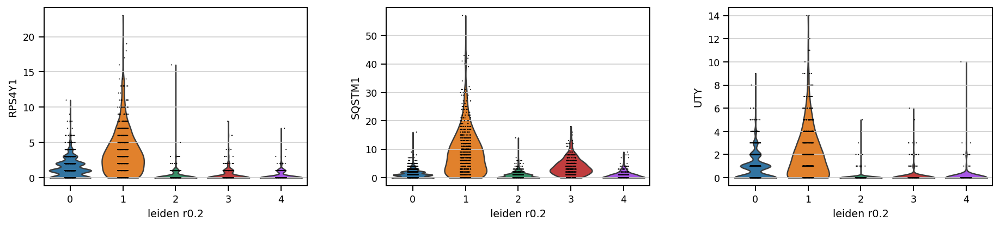

In [123]:
#for cell line 5 
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=['RPS4Y1',"SQSTM1","UTY"], s=50, frameon=False, ncols=4, vmax='p99')
    
with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(adata, ['RPS4Y1',"SQSTM1","UTY"], groupby='leiden_r0.2' )

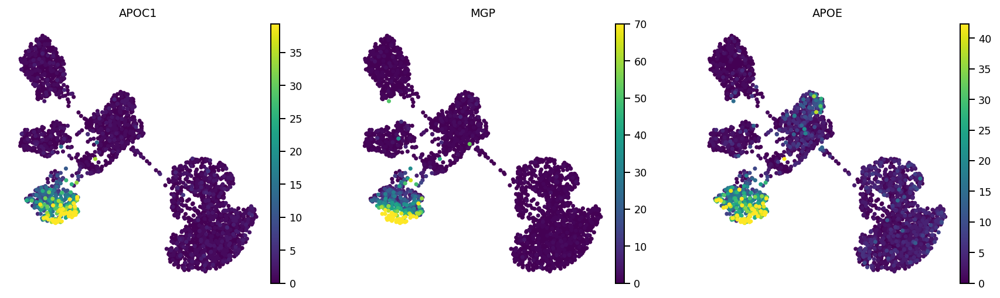

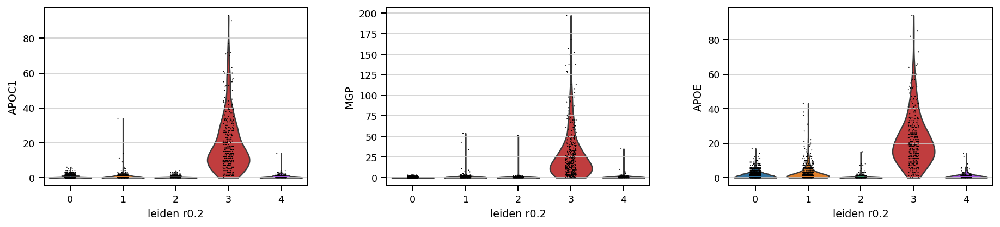

In [122]:
#for cell line 5 
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color=['APOC1','MGP',"APOE"], s=50, frameon=False, ncols=4, vmax='p99')
    
with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(adata, ['APOC1','MGP',"APOE"], groupby='leiden_r0.2' )

In [117]:
marker_genes_dict = {
    'Cell line 1': ['TIMP3',"MMP1","DLC1"],
    'Cell line 2': ["CHCHD6"],
    'Cell line 3': ['COL3A1',"LINC02109","PEG10"],
    'Cell line 4': ['APOC1','MGP',"APOE"],
    'Cell line 5': ['RPS4Y1',"SQSTM1","UTY"]}

categories: 0, 1, 2, etc.
var_group_labels: Cell line 1, Cell line 2, Cell line 3, etc.


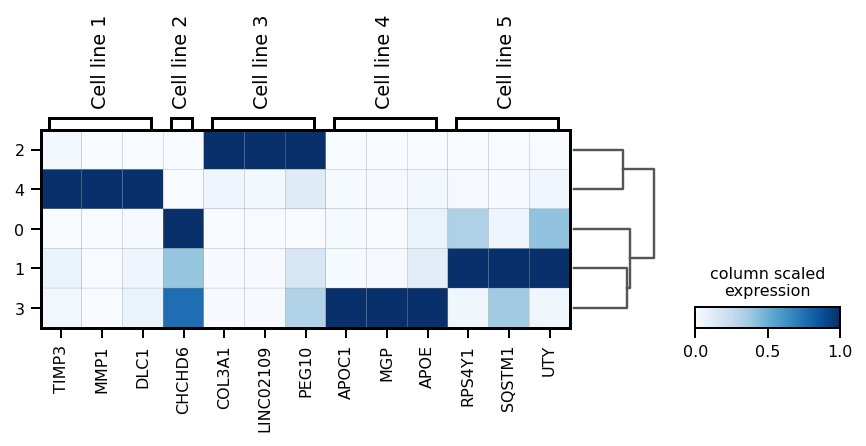

In [118]:
sc.pl.matrixplot(adata, marker_genes_dict, 'leiden_r0.2', dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression')

# Manual Annotation



 Using [panglaodb](https://panglaodb.se/search.html).  and other tools like [enrichR](https://maayanlab.cloud/Enrichr/) annotated the cluster

categories: 0, 1, 2, etc.
var_group_labels: Cell line 1, Cell line 2, Cell line 3, etc.


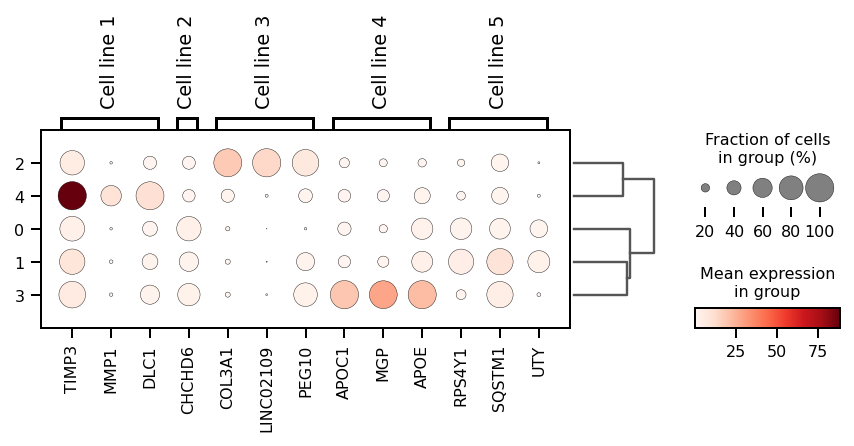

In [120]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_r0.2', dendrogram=True)

#sample composition

In [129]:
adata.obs['annotated'] = adata.obs['sample'].cat.add_categories([ "Cell line 1","Cell line 2","Cell line 3","Cell line 4",'Cell line 5'])
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['0','1','2','3','4','5'])] = 'Cell line 1','Cell line 2','Cell line 3','Cell line 4','Cell line 5'



adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()


sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_annotated_hires_annotated.pdf"
sc.pl.umap(adata, color=['annotated'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

NotImplementedError: isna is not defined for MultiIndex

# automatic annotation

In [130]:
import scorect as ct
ref_marker = ct.read_markers_from_file('/home/jovyan/work/cellline.csv')

In [131]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.2', n_genes=len(adata.raw.var), use_raw=True)

In [132]:
# Wrangle results from existing sc.tl.rank_genes_groups() results
# Let's have a look for cluster 0
marker_df = ct.wrangle_ranks_from_anndata(adata)
print(marker_df.head())

Wrangling: Number of markers used in ranked_gene_groups:  21570
Wrangling: Groups used for ranking: leiden_r0.2
     z_score      adj_pvals        gene cluster_number
0  45.980511  5.967918e-318   LINC01320              0
1  32.103683  2.124929e-184       ROBO2              0
2  31.241566  3.587818e-170    SGO1-AS1              0
3  29.501932  3.396019e-156       ABCB5              0
4  24.516283  7.567915e-113  AC123777.1              0


In [133]:
# Score cell types for each cluster 
# Let's set parameters first - K represents the number of genes included in the ranking
# m represents the number of bins used to divide the top K genes.
K = 300
m = 5
# Get the background genes - here, all the genes used to run the differential gene expression test
background = adata.raw.var.index.tolist()
# Now run the function
ct_pval, ct_score = ct.celltype_scores(nb_bins=m,
                                        ranked_genes=marker_df,
                                        K_top = K,
                                        marker_ref=ref_marker,
                                        background_genes=background,
                                        null_model='multinomial')

... storing 'scorect' as categorical


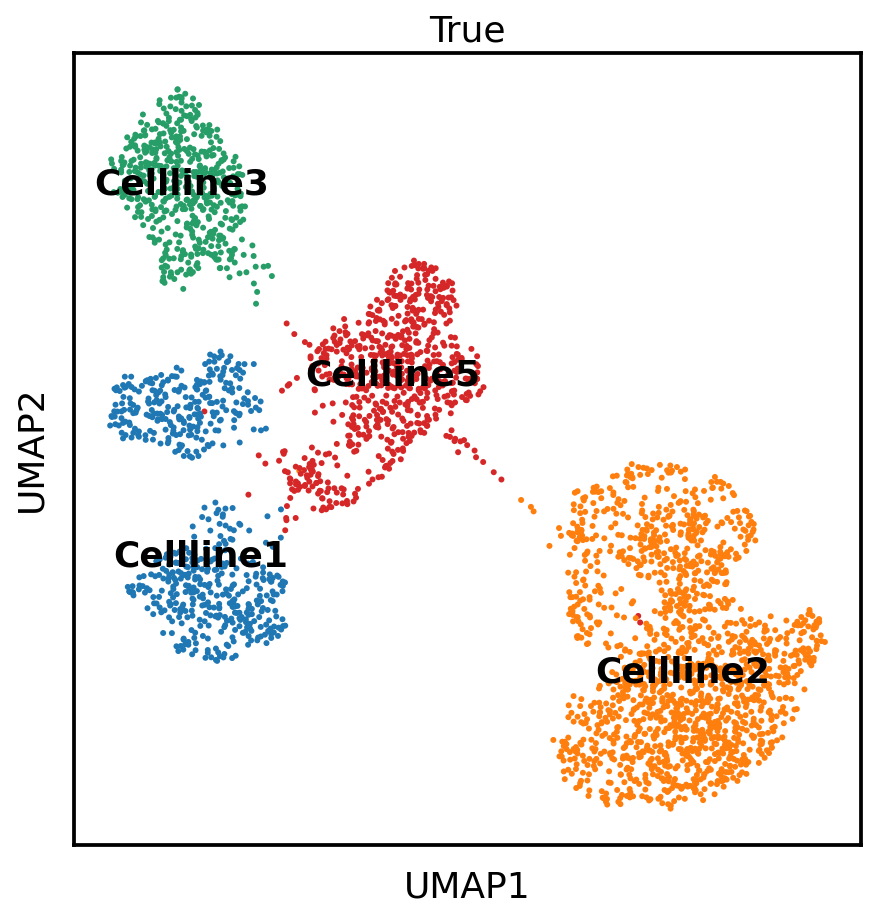

In [134]:
# Now assign clusters to cell types
cluster_assign = adata.obs['leiden_r0.2']
celltype_assign = ct.assign_celltypes(cluster_assignment=cluster_assign, ct_pval_df=ct_pval, ct_score_df=ct_score, cutoff=0.1)
# Add to anndata object
adata.obs['scorect'] = celltype_assign
# Let's compare with the true assignment now! 
sc.pl.umap(adata, color=['scorect'], legend_loc="on data", title=['True','Predicted'], cmap='Set2', wspace=0.33)

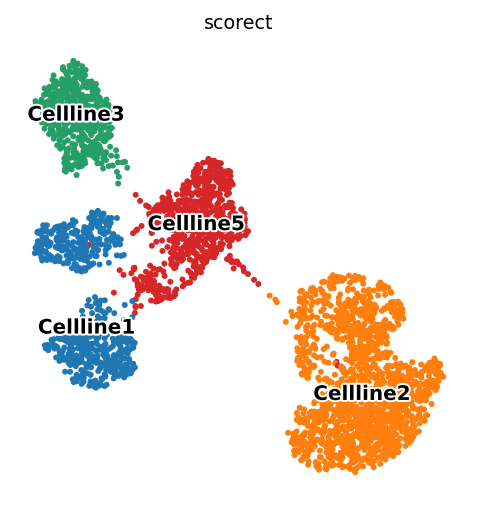

In [110]:
sc.pl.umap(adata, color='scorect', legend_loc='on data',
           frameon=False, legend_fontsize=10, legend_fontoutline=2)

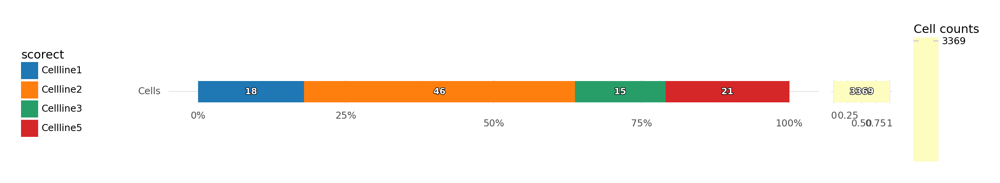

In [111]:
 fig=plot_proportion_barplot_with_ncells(
    adata,
    'sample',
    fill='scorect', 
    fill_breakdown=None,
    yaxis_label=None,
    fill_label='scorect',
    percent_limit=1., 
    show_percent=True,
    height_scale=1., 
    width_scale=1.,
    legend_position=(-0, 0.5),
    normalize_by=None,)
fig.savefig('cell_composition_by_FOV.pdf', dpi=300, bbox_inches='tight')

# gene set enrichment 

In [ ]:
import gseapy
from gseapy.plot import barplot, dotplot

In [ ]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
gene_set_names = gseapy.get_library_name('Human')#choose btw sps 
print(gene_set_names)

In [ ]:
#sc.tl.rank_genes_groups(cdata, 'treatmentcondition', method='t-test' ,key_added = "wilcoxon",layer='sct_corrected',use_raw=False)
sc.tl.rank_genes_groups(adata, 'scorect', method='t-test' ,key_added = "wilcoxon",use_raw=False,layer='sqrt_norm')

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cellline1, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline1', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     description='pathway',
                     cutoff = 0.05)

In [ ]:
enr_res.results.head(10)

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cellline2, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline2', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     description='pathway',
                     cutoff = 0.05)
enr_res.results.head(10)

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cellline3, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline3', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     description='pathway',
                     cutoff = 0.05)
enr_res.results.head(10)

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cellline4, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline4', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     description='pathway',
                     cutoff = 0.05)
enr_res.results.head(10)
dotplot(enr_res.res2d, title='WikiPathways_2019_Human',cmap='viridis_r')

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cellline5, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline5', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     description='pathway',
                     cutoff = 0.05)
enr_res.results.head(10)

dotplot(enr_res.res2d, title='WikiPathways_2019_Human',cmap='viridis_r')

In [ ]:
gseapy.barplot(enr_res.res2d,cutoff = 0.5,title='WikiPathways_2021_Human',save='WikiPathways_2021_Human')

In [ ]:
dotplot(enr_res.res2d,cutoff = 0.5, title='WikiPathways_2021_Human',cmap='viridis_r')

In [ ]:
Geneset='Azimuth_Cell_Types_2021'

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets=Geneset,
                     description='pathway',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title=Geneset,save=Geneset)

In [ ]:
glist=sc.get.rank_genes_groups_df(adata, group='2', key='wilcoxon',log2fc_min=2,pval_cutoff=0.08)['names'].squeeze().str.strip().tolist()
print(len(glist))

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets=Geneset,
                     description='pathway',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title=Geneset,save=Geneset)